# Udacity MLND capstone: [dogs vs cats](https://github.com/nd009/capstone/tree/master/dog_vs_cat)

## <font color=blue>Transfer learning</font>

Bin zhu @ 04.05.2018

使用深度学习方法识别一张图片是猫还是狗。

- 输入：一张彩色图片
- 输出：是猫还是狗
- 可选输出：猫狗面部坐标，猫狗身体mask

---
Reference：

1. [http://nbviewer.jupyter.org/github/ypwhs/dogs_vs_cats/blob/master/transfer_learning.ipynb](http://nbviewer.jupyter.org/github/ypwhs/dogs_vs_cats/blob/master/transfer_learning.ipynb)

2. [http://nbviewer.jupyter.org/github/mlhy/mlnd_lhy/blob/master/ResNet-50-for-Cats.Vs.Dogs-master/ResNet-50%20for%20Cats.Vs.Dogs..ipynb](http://nbviewer.jupyter.org/github/mlhy/mlnd_lhy/blob/master/ResNet-50-for-Cats.Vs.Dogs-master/ResNet-50%20for%20Cats.Vs.Dogs..ipynb)

3. [https://github.com/mtyylx/MLND/blob/master/P6_Dogs_VS_Cats/Class%20Activation%20Map%20Visualizations.ipynb](https://github.com/mtyylx/MLND/blob/master/P6_Dogs_VS_Cats/Class%20Activation%20Map%20Visualizations.ipynb)

### 1. 异常值检测 & 数据集加载

#### 1.1 异常值检测

In [1]:
# dogs & cats in ImageNet
dogs = ['n02085620','n02085782','n02085936','n02086079','n02086240','n02086646','n02086910','n02087046',
        'n02087394','n02088094','n02088238','n02088364','n02088466','n02088632','n02089078','n02089867',
        'n02089973','n02090379','n02090622','n02090721','n02091032','n02091134','n02091244','n02091467',
        'n02091635','n02091831','n02092002','n02092339','n02093256','n02093428','n02093647','n02093754',
        'n02093859','n02093991','n02094114','n02094258','n02094433','n02095314','n02095570','n02095889',
        'n02096051','n02096177','n02096294','n02096437','n02096585','n02097047','n02097130','n02097209',
        'n02097298','n02097474','n02097658','n02098105','n02098286','n02098413','n02099267','n02099429',
        'n02099601','n02099712','n02099849','n02100236','n02100583','n02100735','n02100877','n02101006',
        'n02101388','n02101556','n02102040','n02102177','n02102318','n02102480','n02102973','n02104029',
        'n02104365','n02105056','n02105162','n02105251','n02105412','n02105505','n02105641','n02105855',
        'n02106030','n02106166','n02106382','n02106550','n02106662','n02107142','n02107312','n02107574',
        'n02107683','n02107908','n02108000','n02108089','n02108422','n02108551','n02108915','n02109047',
        'n02109525','n02109961','n02110063','n02110185','n02110341','n02110627','n02110806','n02110958',
        'n02111129','n02111277','n02111500','n02111889','n02112018','n02112137','n02112350','n02112706',
        'n02113023','n02113186','n02113624','n02113712','n02113799','n02113978']

cats = ['n02123045','n02123159','n02123394','n02123597','n02124075','n02125311','n02127052']

In [1]:
from keras.applications import inception_resnet_v2, xception
from keras.preprocessing import image
import numpy as np
from tqdm import tqdm

IMG_SHAPE = (299, 299)
model_1 = inception_resnet_v2.InceptionResNetV2(weights='imagenet')
model_2 = xception.Xception(weights='imagenet')

Using TensorFlow backend.


In [3]:
out_cat = [[], []]
out_dog = [[], []]
N = 30

for i in tqdm(range(12500)):
    img_cat = image.load_img('data/train1/cat/cat.%d.jpg' % i, target_size=IMG_SHAPE)
    img_dog = image.load_img('data/train1/dog/dog.%d.jpg' % i, target_size=IMG_SHAPE)
    x_cat = image.img_to_array(img_cat)
    x_dog = image.img_to_array(img_dog)
    x_cat = inception_resnet_v2.preprocess_input(np.expand_dims(x_cat, axis=0))
    x_dog = xception.preprocess_input(np.expand_dims(x_dog, axis=0))
    pred_cat_1 = model_1.predict(x_cat)
    pred_cat_2 = model_2.predict(x_cat)
    pred_dog_1 = model_1.predict(x_dog)
    pred_dog_2 = model_2.predict(x_dog)
    
    flag_1 = False
    for n in inception_resnet_v2.decode_predictions(pred_cat_1, top=N)[0]:
        if n[0] in cats:
            flag_1 = True
    if not flag_1:
        out_cat[0].append(i)
        
    flag_2 = False
    for n in xception.decode_predictions(pred_cat_2, top=N)[0]:
        if n[0] in cats:
            flag_2 = True
    if not flag_2:
        out_cat[1].append(i)
        
    flag_3 = False
    for n in inception_resnet_v2.decode_predictions(pred_dog_1, top=N)[0]:
        if n[0] in dogs:
            flag_3 = True
    if not flag_3:
        out_dog[0].append(i)
        
    flag_4 = False
    for n in xception.decode_predictions(pred_dog_2, top=N)[0]:
        if n[0] in dogs:
            flag_4 = True
    if not flag_4:
        out_dog[1].append(i)

100%|██████████| 12500/12500 [48:54<00:00,  4.26it/s]


In [11]:
out = [[], []]

for n in out_cat[1]:
    if n in out_cat[0]:
        out[0].append(n)
for n in out_dog[1]:
    if n in out_dog[0]:
        out[1].append(n)
    
print(len(out[0]), len(out[1]), '\n',out)

47 21 
 [[252, 372, 503, 1741, 2150, 2433, 2520, 2939, 3216, 3658, 3672, 3731, 3868, 4308, 4338, 4688, 4852, 5071, 5347, 5351, 5418, 6429, 6442, 6655, 6699, 7377, 7487, 7564, 7599, 7920, 7968, 8456, 8470, 9090, 9171, 9444, 9596, 10029, 10270, 10365, 10712, 11184, 11231, 11544, 12227, 12272, 12424], [1194, 1259, 1308, 1773, 1895, 2422, 2614, 3889, 4367, 5604, 6475, 6725, 8736, 9188, 9517, 10161, 10190, 10237, 10801, 11299, 12376]]


In [2]:
out = [[252, 372, 503, 1741, 2150, 2433, 2520, 2939, 3216, 3658, 3672, 3731, 3868, 4308, 4338, 4688, 4852, 5071, 5347, 5351, 5418, 6429, 6442, 6655, 6699, 7377, 7487, 7564, 7599, 7920, 7968, 8456, 8470, 9090, 9171, 9444, 9596, 10029, 10270, 10365, 10712, 11184, 11231, 11544, 12227, 12272, 12424], [1194, 1259, 1308, 1773, 1895, 2422, 2614, 3889, 4367, 5604, 6475, 6725, 8736, 9188, 9517, 10161, 10190, 10237, 10801, 11299, 12376]]

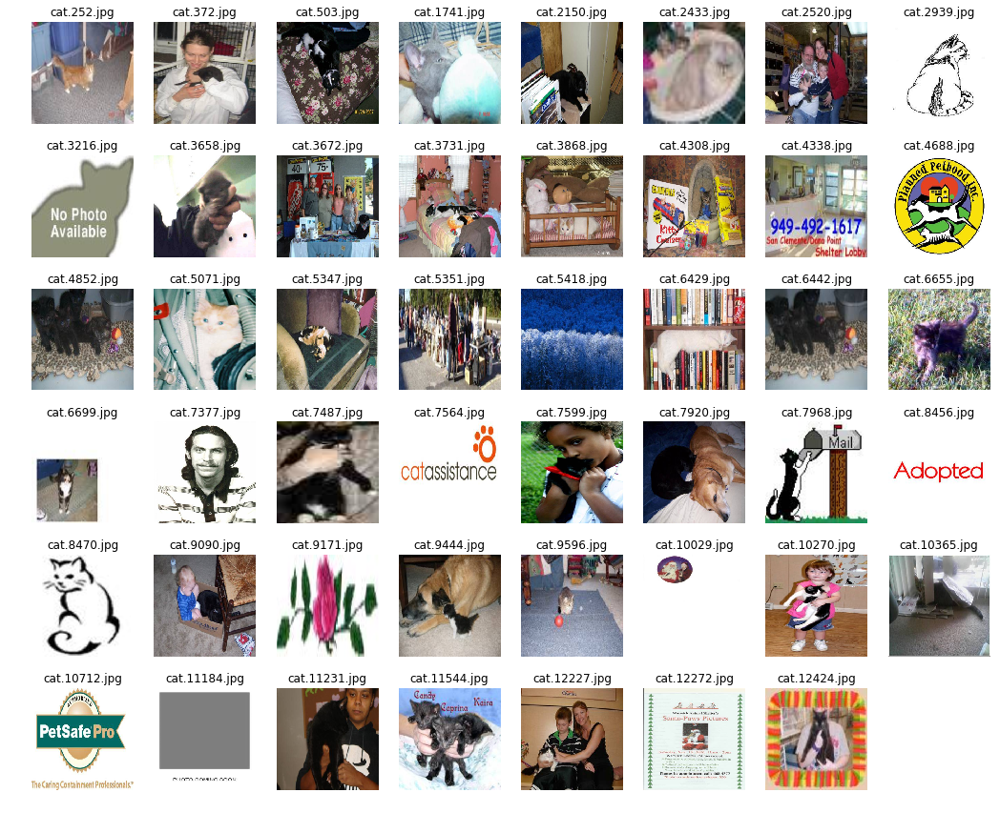

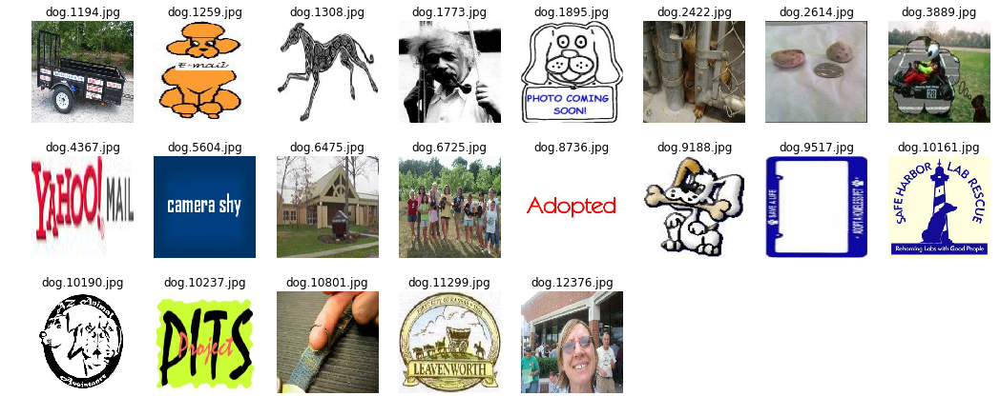

In [2]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

IMG_SHAPE = (299, 299)

plt.figure(figsize=(18,15))
n = 0
for i in out[0]:
    img = cv2.resize(cv2.imread('data/train1/cat/cat.%d.jpg' % i), IMG_SHAPE)
    plt.subplot(6, 8, n+1)
    plt.title('cat.%d.jpg' % i)
    plt.axis('off')
    plt.imshow(img[:, :, ::-1])
    n += 1

plt.figure(figsize=(18,10))
n = 0
for i in out[1]:
    img = cv2.resize(cv2.imread('data/train1/dog/dog.%d.jpg' % i), IMG_SHAPE)
    plt.subplot(4, 8, n+1)
    plt.title('dog.%d.jpg' % i)
    plt.axis('off')
    plt.imshow(img[:, :, ::-1])
    n += 1

#### 1.2 数据集加载

In [3]:
import cv2
from sklearn.model_selection import train_test_split

from keras.models import Model
from keras.layers import Input, Lambda, Dense, Dropout, GlobalAveragePooling2D
from keras import optimizers

np.random.seed(2018)

IMG_SHAPE = (299, 299)
n_cat = 12500 - len(out[0])
n_dog = 12500 - len(out[1])
n_train = n_cat + n_dog

X = np.zeros((n_train, IMG_SHAPE[0], IMG_SHAPE[1], 3), dtype=np.uint8)
y = np.zeros((n_train, 1), dtype=np.uint8)

i, j = 0, 0
for n in tqdm(range(12500)):
    if n not in out[0] and n in out[1]:
        X[n - i] = cv2.resize(cv2.imread('data/train1/cat/cat.%d.jpg' % n), IMG_SHAPE)
        j += 1
    if n not in out[1] and n in out[0]:
        X[n + n_cat - j] = cv2.resize(cv2.imread('data/train1/dog/dog.%d.jpg' % n), IMG_SHAPE)
        i += 1
    if n in out[0] and n in out[1]:
        i += 1
        j += 1
    else:
        X[n - i] = cv2.resize(cv2.imread('data/train1/cat/cat.%d.jpg' % n), IMG_SHAPE)
        X[n + n_cat - j] = cv2.resize(cv2.imread('data/train1/dog/dog.%d.jpg' % n), IMG_SHAPE)
        

y[n_cat:] = 1

X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2)

100%|██████████| 12500/12500 [00:53<00:00, 233.71it/s]


### 2. 模型构建

In [4]:
input_tensor = Input((IMG_SHAPE[0], IMG_SHAPE[1], 3))
x = Lambda(inception_resnet_v2.preprocess_input)(input_tensor)
base_model = inception_resnet_v2.InceptionResNetV2(input_tensor=x, weights='imagenet', include_top=False)

for layers in base_model.layers[:762]:
    layers.trainable = False
for layers in base_model.layers[763:]:
    layers.trainable = True

x = GlobalAveragePooling2D()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.7)(x)
x = Dense(1, activation='sigmoid')(x)
model = Model(input_tensor, x)

model.compile(optimizer='adadelta',
              loss='binary_crossentropy',
              metrics=['accuracy'])

219062272/219055592 [==============================] - 3s 0us/step


In [5]:
from keras import backend as K

def get_params_count(model):
    trainable = int(np.sum([K.count_params(p) for p in set(model.trainable_weights)]))
    non_trainable = int(np.sum([K.count_params(p) for p in set(model.non_trainable_weights)]))
    return trainable, non_trainable

print('Trainable Parameters: ', get_params_count(model)[0])
print('Non_trainable Parameters: ', get_params_count(model)[1])

Trainable Parameters:  5624705
Non_trainable Parameters:  49105760


### 3. 训练模型 & finetune

In [6]:
from keras.callbacks import TensorBoard
from keras.callbacks import EarlyStopping
from keras.callbacks import LambdaCallback

log_filepath = '/tmp/keras/inception_resnet_v2/adadelta'
tb_cb = TensorBoard(log_dir=log_filepath, histogram_freq=0, write_graph=True, write_images=True)

es_cb = EarlyStopping(monitor='val_loss', patience=2, min_delta=0, verbose=0, mode='auto')

weights = []
gw_cb = LambdaCallback(on_batch_end=lambda batch, logs:weights.append(model.layers[-6].get_weights()[0]))

In [7]:
# input_tensor = Input((IMG_SHAPE[0], IMG_SHAPE[1], 3))
# x = Lambda(inception_resnet_v2.preprocess_input)(input_tensor)
# base_model = InceptionResNetV2(input_tensor=x, weights='imagenet', include_top=False)

# for layers in base_model.layers[:762]:
#     layers.trainable = False
# for layers in base_model.layers[763:]:
#     layers.trainable = True

# x = GlobalAveragePooling2D()(base_model.output)
# x = Dense(256, activation='relu')(x)
# x = Dropout(0.7)(x)
# x = Dense(1, activation='sigmoid')(x)
# model = Model(input_tensor, x)

# model.compile(optimizer='adadelta',
#               loss='binary_crossentropy',
#               metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=1, 
          validation_data=(X_valid, y_valid), callbacks=[tb_cb, es_cb, gw_cb])

Train on 19945 samples, validate on 4987 samples
Epoch 1/1
19945/19945 [==============================] - 683s 34ms/step - loss: 0.0787 - acc: 0.9693 - val_loss: 0.0345 - val_acc: 0.9908


In [6]:
# input_tensor = Input((IMG_SHAPE[0], IMG_SHAPE[1], 3))
# x = Lambda(inception_resnet_v2.preprocess_input)(input_tensor)
# base_model = InceptionResNetV2(input_tensor=x, weights='imagenet', include_top=False)

# for layers in base_model.layers[:762]:
#     layers.trainable = False
# for layers in base_model.layers[763:]:
#     layers.trainable = True

# x = GlobalAveragePooling2D()(base_model.output)
# x = Dense(256, activation='relu')(x)
# x = Dropout(0.7)(x)
# x = Dense(1, activation='sigmoid')(x)
# model = Model(input_tensor, x)

# model.compile(optimizer='adadelta',
#               loss='binary_crossentropy',
#               metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=3, 
          validation_data=(X_valid, y_valid), callbacks=[tb_cb, es_cb, gw_cb])

Train on 19945 samples, validate on 4987 samples
Epoch 1/3
19945/19945 [==============================] - 613s 31ms/step - loss: 0.0787 - acc: 0.9695 - val_loss: 0.0355 - val_acc: 0.9906
Epoch 2/3
19945/19945 [==============================] - 596s 30ms/step - loss: 0.0287 - acc: 0.9900 - val_loss: 0.0281 - val_acc: 0.9920
Epoch 3/3
19945/19945 [==============================] - 596s 30ms/step - loss: 0.0152 - acc: 0.9949 - val_loss: 0.0241 - val_acc: 0.9952


In [7]:
# input_tensor = Input((IMG_SHAPE[0], IMG_SHAPE[1], 3))
# x = Lambda(inception_resnet_v2.preprocess_input)(input_tensor)
# base_model = InceptionResNetV2(input_tensor=x, weights='imagenet', include_top=False)

# for layers in base_model.layers[:762]:
#     layers.trainable = False
# for layers in base_model.layers[763:]:
#     layers.trainable = True

# x = GlobalAveragePooling2D()(base_model.output)
# x = Dense(256, activation='relu')(x)
# x = Dropout(0.7)(x)
# x = Dense(1, activation='sigmoid')(x)
# model = Model(input_tensor, x)

# model.compile(optimizer='adagrad',
#               loss='binary_crossentropy',
#               metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=10, validation_data=(X_valid, y_valid), callbacks=[tb_cb, es_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/10
20000/20000 [==============================] - 632s 32ms/step - loss: 0.2347 - acc: 0.9559 - val_loss: 0.0647 - val_acc: 0.9882
Epoch 2/10
20000/20000 [==============================] - 628s 31ms/step - loss: 0.0214 - acc: 0.9926 - val_loss: 0.0394 - val_acc: 0.9940
Epoch 3/10
20000/20000 [==============================] - 628s 31ms/step - loss: 0.0092 - acc: 0.9969 - val_loss: 0.0554 - val_acc: 0.9928
Epoch 4/10
20000/20000 [==============================] - 628s 31ms/step - loss: 0.0041 - acc: 0.9990 - val_loss: 0.2774 - val_acc: 0.9312


In [15]:
# adam 0.5-128-0.5 free763:
# log_filepath = '/tmp/keras/inception_resnet_v2/adam_free763'
# for layers in base_model.layers[:762]:
#     layers.trainable = False
# for layers in base_model.layers[763:]:
#     layers.trainable = True

# x = GlobalAveragePooling2D()(base_model.output)
# x = Dropout(0.5)(x)
# x = Dense(128, activation='relu')(x)
# x = Dropout(0.5)(x)
# x = Dense(1, activation='sigmoid')(x)
# model = Model(input_tensor, x)

# model.compile(optimizer='adam',
#               loss='binary_crossentropy',
#               metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=10, validation_data=(X_valid, y_valid), callbacks=[tb_cb, es_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/10
20000/20000 [==============================] - 640s 32ms/step - loss: 0.0687 - acc: 0.9726 - val_loss: 0.0706 - val_acc: 0.9858
Epoch 2/10
20000/20000 [==============================] - 637s 32ms/step - loss: 0.0212 - acc: 0.9932 - val_loss: 0.1568 - val_acc: 0.9750
Epoch 3/10
20000/20000 [==============================] - 636s 32ms/step - loss: 0.0116 - acc: 0.9960 - val_loss: 0.0603 - val_acc: 0.9912
Epoch 4/10
20000/20000 [==============================] - 636s 32ms/step - loss: 0.0079 - acc: 0.9972 - val_loss: 0.0659 - val_acc: 0.9910
Epoch 5/10
20000/20000 [==============================] - 636s 32ms/step - loss: 0.0046 - acc: 0.9988 - val_loss: 0.0636 - val_acc: 0.9912


In [12]:
# adam dropout0.9 free763:
# log_filepath = '/tmp/keras/inception_resnet_v2/adam_free763'
#for layers in base_model.layers[:762]:
#    layers.trainable = False
#for layers in base_model.layers[763:]:
#    layers.trainable = True

#x = GlobalAveragePooling2D()(base_model.output)
#x = Dense(256, activation='relu')(x)
#x = Dropout(0.9)(x)
#x = Dense(1, activation='sigmoid')(x)
#model = Model(input_tensor, x)

#model.compile(optimizer='adam',
#              loss='binary_crossentropy',
#              metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=10, validation_data=(X_valid, y_valid), callbacks=[tb_cb, es_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/10
20000/20000 [==============================] - 641s 32ms/step - loss: 0.0870 - acc: 0.9679 - val_loss: 0.0794 - val_acc: 0.9868
Epoch 2/10
20000/20000 [==============================] - 637s 32ms/step - loss: 0.0273 - acc: 0.9908 - val_loss: 0.0394 - val_acc: 0.9940
Epoch 3/10
20000/20000 [==============================] - 637s 32ms/step - loss: 0.0145 - acc: 0.9952 - val_loss: 0.0497 - val_acc: 0.9930
Epoch 4/10
20000/20000 [==============================] - 637s 32ms/step - loss: 0.0112 - acc: 0.9965 - val_loss: 0.0695 - val_acc: 0.9928


In [8]:
# adam dropout0.7 free763:
# log_filepath = '/tmp/keras/inception_resnet_v2/adam_free763'
#for layers in base_model.layers[:762]:
#    layers.trainable = False
#for layers in base_model.layers[763:]:
#    layers.trainable = True

#x = GlobalAveragePooling2D()(base_model.output)
#x = Dense(256, activation='relu')(x)
#x = Dropout(0.7)(x)
#x = Dense(1, activation='sigmoid')(x)
#model = Model(input_tensor, x)

#model.compile(optimizer='adam',
#              loss='binary_crossentropy',
#              metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=10, validation_data=(X_valid, y_valid), callbacks=[tb_cb, es_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/10
20000/20000 [==============================] - 646s 32ms/step - loss: 0.0714 - acc: 0.9724 - val_loss: 0.0376 - val_acc: 0.9940
Epoch 2/10
20000/20000 [==============================] - 644s 32ms/step - loss: 0.0227 - acc: 0.9919 - val_loss: 0.0484 - val_acc: 0.9924
Epoch 3/10
20000/20000 [==============================] - 644s 32ms/step - loss: 0.0096 - acc: 0.9971 - val_loss: 0.0586 - val_acc: 0.9906


In [ ]:
# adam dropout0.7
# log_filepath = '/tmp/keras/inception_resnet_v2/adam'
#x = GlobalAveragePooling2D()(base_model.output)
#x = Dense(256, activation='relu')(x)
#x = Dropout(0.7)(x)
#x = Dense(1, activation='sigmoid')(x)
#model = Model(input_tensor, x)

#model.compile(optimizer='adam',
#              loss='binary_crossentropy',
#              metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=10, validation_data=(X_valid, y_valid), callbacks=[tb_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/10
20000/20000 [==============================] - 597s 30ms/step - loss: 0.1150 - acc: 0.9546 - val_loss: 0.0368 - val_acc: 0.9898
Epoch 2/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0677 - acc: 0.9752 - val_loss: 0.0846 - val_acc: 0.9780
Epoch 3/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0527 - acc: 0.9807 - val_loss: 0.0952 - val_acc: 0.9770
Epoch 4/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0541 - acc: 0.9793 - val_loss: 0.0749 - val_acc: 0.9814
Epoch 5/10
19968/20000 [============================>.] - ETA: 0s - loss: 0.0485 - acc: 0.9817

In [7]:
# sgd:0.1 0.9 0 dropout0.5
# log_filepath = '/tmp/keras/inception_resnet_v2/sgd_001090'
#for layers in base_model.layers:
#    layers.trainable = False

#for layers in base_model.layers:
#    layers.trainable = False

#x = GlobalAveragePooling2D()(base_model.output)
#x = Dropout(0.5)(x)
#x = Dense(1, activation='sigmoid')(x)
#model = Model(input_tensor, x)

#sgd = optimizers.SGD(lr=0.1, momentum=0.9, decay=0)
#model.compile(optimizer=sgd,
#              loss='binary_crossentropy',
#              metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=10, validation_data=(X_valid, y_valid), callbacks=[tb_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/10
20000/20000 [==============================] - 618s 31ms/step - loss: 0.1224 - acc: 0.9483 - val_loss: 0.0708 - val_acc: 0.9818
Epoch 2/10
20000/20000 [==============================] - 615s 31ms/step - loss: 0.0720 - acc: 0.9741 - val_loss: 0.1046 - val_acc: 0.9734
Epoch 3/10
20000/20000 [==============================] - 615s 31ms/step - loss: 0.0730 - acc: 0.9745 - val_loss: 0.1062 - val_acc: 0.9744
Epoch 4/10
 7168/20000 [=========>....................] - ETA: 5:11 - loss: 0.0778 - acc: 0.9721

KeyboardInterrupt: 

In [4]:
# sgd:0.01 0.9 0 dropout0.7
# log_filepath = '/tmp/keras/inception_resnet_v2/sgd_001090'
#for layers in base_model.layers:
#    layers.trainable = False

#x = GlobalAveragePooling2D()(base_model.output)
#x = Dense(256, activation='relu')(x)
#x = Dropout(0.7)(x)
#x = Dense(1, activation='sigmoid')(x)
#model = Model(input_tensor, x)

# log_filepath = '/tmp/keras/inception_resnet_v2/sgd_001090'
# sgd = optimizers.SGD(lr=0.01, momentum=0.9, decay=0)
# model.compile(optimizer=sgd,
#              loss='binary_crossentropy',
#              metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=10, validation_data=(X_valid, y_valid), callbacks=[tb_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/10
20000/20000 [==============================] - 729s 36ms/step - loss: 0.2189 - acc: 0.9113 - val_loss: 0.0582 - val_acc: 0.9850
Epoch 2/10
20000/20000 [==============================] - 615s 31ms/step - loss: 0.0864 - acc: 0.9701 - val_loss: 0.0583 - val_acc: 0.9848
Epoch 3/10
20000/20000 [==============================] - 615s 31ms/step - loss: 0.0730 - acc: 0.9743 - val_loss: 0.0674 - val_acc: 0.9824
Epoch 4/10
20000/20000 [==============================] - 614s 31ms/step - loss: 0.0672 - acc: 0.9764 - val_loss: 0.0599 - val_acc: 0.9836
Epoch 5/10
20000/20000 [==============================] - 615s 31ms/step - loss: 0.0621 - acc: 0.9788 - val_loss: 0.0730 - val_acc: 0.9808
Epoch 6/10


KeyboardInterrupt: 

In [5]:
# sgd:0.1 0.9 0 dropout0.8
#for layers in base_model.layers:
#    layers.trainable = False

#x = GlobalAveragePooling2D()(base_model.output)
#x = Dense(256, activation='relu')(x)
#x = Dropout(0.8)(x)
#x = Dense(1, activation='sigmoid')(x)
#model = Model(input_tensor, x)

# log_filepath = '/tmp/keras/inception_resnet_v2/sgd_01090_drop08'
# sgd = optimizers.SGD(lr=0.1, momentum=0.9, decay=0)
# model.compile(optimizer=sgd,
#              loss='binary_crossentropy',
#              metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=10, validation_data=(X_valid, y_valid), callbacks=[tb_cb, es_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/10
20000/20000 [==============================] - 634s 32ms/step - loss: 0.1415 - acc: 0.9405 - val_loss: 0.0831 - val_acc: 0.9778
Epoch 2/10
20000/20000 [==============================] - 625s 31ms/step - loss: 0.0808 - acc: 0.9718 - val_loss: 0.0584 - val_acc: 0.9852
Epoch 3/10
20000/20000 [==============================] - 625s 31ms/step - loss: 0.0886 - acc: 0.9686 - val_loss: 0.0700 - val_acc: 0.9830
Epoch 4/10
20000/20000 [==============================] - 625s 31ms/step - loss: 0.0759 - acc: 0.9720 - val_loss: 0.0678 - val_acc: 0.9844


In [9]:
# sgd:0.1 0.7 0 dropout0.7
#for layers in base_model.layers:
#    layers.trainable = False

#x = GlobalAveragePooling2D()(base_model.output)
#x = Dense(256, activation='relu')(x)
#x = Dropout(0.7)(x)
#x = Dense(1, activation='sigmoid')(x)
#model = Model(input_tensor, x)

# log_filepath = '/tmp/keras/inception_resnet_v2/sgd_01070_drop0.7'
# sgd = optimizers.SGD(lr=0.1, momentum=0.7, decay=0)
# model.compile(optimizer=sgd,
#              loss='binary_crossentropy',
#              metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=10, validation_data=(X_valid, y_valid), callbacks=[tb_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/10
20000/20000 [==============================] - 595s 30ms/step - loss: 0.1328 - acc: 0.9467 - val_loss: 0.0551 - val_acc: 0.9848
Epoch 2/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0652 - acc: 0.9768 - val_loss: 0.0324 - val_acc: 0.9926
Epoch 3/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0615 - acc: 0.9769 - val_loss: 0.0712 - val_acc: 0.9812
Epoch 4/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0564 - acc: 0.9792 - val_loss: 0.0396 - val_acc: 0.9890
Epoch 5/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0506 - acc: 0.9815 - val_loss: 0.0651 - val_acc: 0.9826
Epoch 6/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0473 - acc: 0.9818 - val_loss: 0.0820 - val_acc: 0.9806
Epoch 7/10
20000/20000 [==============================] - 591s 30ms/step - loss: 0.0481 - acc: 0.9810 - val_loss: 0.1

KeyboardInterrupt: 

In [4]:
# sgd:0.1 0.5 0 dropout0.5
#for layers in base_model.layers:
#    layers.trainable = False

#x = GlobalAveragePooling2D()(base_model.output)
#x = Dense(256, activation='relu')(x)
#x = Dropout(0.5)(x)
#x = Dense(1, activation='sigmoid')(x)
#model = Model(input_tensor, x)

# log_filepath = '/tmp/keras/inception_resnet_v2/sgd_01070'
# sgd = optimizers.SGD(lr=0.1, momentum=0.5, decay=0)
# model.compile(optimizer=sgd,
#              loss='binary_crossentropy',
#              metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=10, validation_data=(X_valid, y_valid), callbacks=[tb_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/10
20000/20000 [==============================] - 653s 33ms/step - loss: 0.1192 - acc: 0.9506 - val_loss: 0.0774 - val_acc: 0.9788
Epoch 2/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0609 - acc: 0.9778 - val_loss: 0.0583 - val_acc: 0.9848
Epoch 3/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0552 - acc: 0.9804 - val_loss: 0.0630 - val_acc: 0.9844
Epoch 4/10
20000/20000 [==============================] - 591s 30ms/step - loss: 0.0488 - acc: 0.9825 - val_loss: 0.0470 - val_acc: 0.9886
Epoch 5/10
20000/20000 [==============================] - 591s 30ms/step - loss: 0.0488 - acc: 0.9812 - val_loss: 0.0969 - val_acc: 0.9770
Epoch 6/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0405 - acc: 0.9849 - val_loss: 0.0769 - val_acc: 0.9818
Epoch 7/10
20000/20000 [==============================] - 592s 30ms/step - loss: 0.0432 - acc: 0.9840 - val_loss: 0.0

KeyboardInterrupt: 

In [4]:
# sgd free763:
# log_filepath = '/tmp/keras/inception_resnet_v2/sgd_01090_free763_drop0.7'
# for layers in base_model.layers[:762]:
#     layers.trainable = False
# for layers in base_model.layers[763:]:
#     layers.trainable = True

# x = GlobalAveragePooling2D()(base_model.output)
# x = Dense(128, activation='relu')(x)
# x = Dropout(0.7)(x)
# x = Dense(1, activation='sigmoid')(x)
# model = Model(input_tensor, x)

# sgd = optimizers.SGD(lr=0.1, momentum=0.9)
# model.compile(optimizer=sgd,
#               loss='binary_crossentropy',
#               metrics=['accuracy'])

model.fit(X_train, y_train, batch_size=256, epochs=10, validation_data=(X_valid, y_valid), callbacks=[tb_cb, es_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/10
20000/20000 [==============================] - 644s 32ms/step - loss: 0.0967 - acc: 0.9600 - val_loss: 0.0484 - val_acc: 0.9892
Epoch 2/10
20000/20000 [==============================] - 630s 31ms/step - loss: 0.0330 - acc: 0.9877 - val_loss: 0.0301 - val_acc: 0.9938
Epoch 3/10
20000/20000 [==============================] - 630s 32ms/step - loss: 0.0272 - acc: 0.9909 - val_loss: 0.0667 - val_acc: 0.9886
Epoch 4/10
 1024/20000 [>.............................] - ETA: 7:55 - loss: 0.0108 - acc: 0.9951

KeyboardInterrupt: 

下述表格数据均是数据集未去除异常值时实验所得

| network structure | free layers | optimizer | batch_size | val_losses | best_val_loss | val_acc| epoch_best_val | test_score|
|:|
| 256('r')+0.5+1('s') | -  | sgd(0.1, 0.5) | 256 | 0.0774, 0.0583, 0.0630, 0.0470, 0.0969, 0.0769 | 0.0470 | 0.9886 |  4 | - |
| 256('r')+0.5+1('s') |  -  | sgd(0.1, 0.9) | 256 | 0.0708, 0.1046, 0.1062         | 0.0708 | 0.9818 | 1 | - |
| 256('r')+0.7+1('s') |  -  | sgd(0.1, 0.7) | 256 | 0.0551, 0.0324, 0.0712, 0.0396 | 0.0324 | 0.9890 | 2 | - |
| 256('r')+0.8+1('s') |  -  | sgd(0.1, 0.9) | 256 | 0.0831, 0.0584, 0.0700, 0.0678 | 0.0584 | 0.9852 | 2 | - |
| 256('r')+0.7+1('s') |  -  | sgd(0.01, 0.9)| 256 | 0.0582, 0.0583, 0.0574         | 0.0582 | 0.9850 | 1 | - |
| 128('r')+0.7+1('s') | 763:| sgd(0.1, 0.9) | 256 | 0.0484, 0.0301, 0.0667, --------- | 0.0301 | 0.9938 | 2 | - |
| 256('r')+0.7+1('s') |  -  |     adam      | 256 | 0.0368, 0.0846, 0.0952         | 0.0368 | 0.9898 | 1 | - |
| 256('r')+0.5+1('s') | 763:|     adam      | 256 | 0.0376, 0.0484, 0.0586         | 0.0376 | 0.9940 | 1 | - |
| 256('r')+0.9+1('s') | 763:|     adam      | 256 | 0.0794, 0.0394, 0.0497, 0.0695 | 0.0394 | 0.9940 | 2 | - |
| 0.5+128('r')+0.5+1('s') | 763:|     adam  | 256 | 0.0706, 0.1568, 0.0603, 0.0659, 0.0636 | 0.0603 | 0.9912 | 3 | - |
| 256('r')+0.7+1('s') | 763:|   adadelta    | 256 | 0.0300, 0.0446, 0.0296, 0.0540, 0.0634 | 0.0296 | 0.9948 | 3 | 0.04662(0.12213) |
| 256('r')+0.7+1('s') | 763:|    adagrad    | 256 | 0.0647, 0.0394, 0.0554, 0.2774 | 0.0394 | 0.9940 | 2 | - |

### 4. 模型结构可视化

In [7]:
list(zip(range(len(model.layers)), [x.name for x in model.layers]))

[(0, 'input_1'),
 (1, 'lambda_1'),
 (2, 'conv2d_1'),
 (3, 'batch_normalization_1'),
 (4, 'activation_1'),
 (5, 'conv2d_2'),
 (6, 'batch_normalization_2'),
 (7, 'activation_2'),
 (8, 'conv2d_3'),
 (9, 'batch_normalization_3'),
 (10, 'activation_3'),
 (11, 'max_pooling2d_1'),
 (12, 'conv2d_4'),
 (13, 'batch_normalization_4'),
 (14, 'activation_4'),
 (15, 'conv2d_5'),
 (16, 'batch_normalization_5'),
 (17, 'activation_5'),
 (18, 'max_pooling2d_2'),
 (19, 'conv2d_9'),
 (20, 'batch_normalization_9'),
 (21, 'activation_9'),
 (22, 'conv2d_7'),
 (23, 'conv2d_10'),
 (24, 'batch_normalization_7'),
 (25, 'batch_normalization_10'),
 (26, 'activation_7'),
 (27, 'activation_10'),
 (28, 'average_pooling2d_1'),
 (29, 'conv2d_6'),
 (30, 'conv2d_8'),
 (31, 'conv2d_11'),
 (32, 'conv2d_12'),
 (33, 'batch_normalization_6'),
 (34, 'batch_normalization_8'),
 (35, 'batch_normalization_11'),
 (36, 'batch_normalization_12'),
 (37, 'activation_6'),
 (38, 'activation_8'),
 (39, 'activation_11'),
 (40, 'activation_

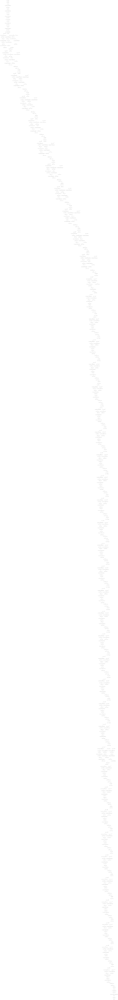

In [9]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

# SVG(model_to_dot(model).create(prog='dot', format='svg'))
SVG(model_to_dot(model, show_shapes=True).create(prog='dot', format='svg'))

### 5. 预测并保存结果

In [8]:
model.save('model.h5')

In [ ]:
from keras.models import load_model

model = load_model('model.h5')

In [9]:
n_test = 12500
X_test = np.zeros((n_test, IMG_SHAPE[0], IMG_SHAPE[1], 3), dtype=np.uint8)

for i in tqdm(range(1, n_test+1)):
    X_test[i - 1] = cv2.resize(cv2.imread('data/test/%d.jpg' % i), IMG_SHAPE)
    
prediction = model.predict(X_test, verbose=1)

100%|██████████| 12500/12500 [00:25<00:00, 490.23it/s]


12500/12500 [==============================] - 336s 27ms/step


In [11]:
prediction = prediction.clip(min=0.005, max=0.995)

s = 'id,label\n'
for i, p in enumerate(prediction):
    s += '%d,%f\n' % (i+1, p)

with open('submission/finetune_inception_resnet_v2_best.csv', 'w') as f:
    f.write(s)

### 6. ensemble

In [64]:
import pandas as pd

pred_1 = pd.read_csv('submission/pred_IncResV2_noclip.csv')
pred_2 = pd.read_csv('submission/xcep_sgd_noclip.csv')
pred_3 = pd.read_csv('submission/xcep_RMSprop_noclip.csv')

pred_en = 'id,label\n'
for i in range(12500):
    pred = (pred_1.iloc[i, 1]   + pred_2.iloc[i, 1]   + pred_3.iloc[i, 1]) / 3
#     if pred > 0.995: pred = 0.995
#     if pred < 0.005: pred = 0.005
    pred_en += '%d,%f\n' % (i+1, pred)

with open('submission/en_vecincresv2_xcesgd_xcerms_noclip.csv', 'w') as f:
    f.write(pred_en)

| model1(clip=no)  |  model2(clip=no)   | model3(clip=no) | model4(clip=no) | model5(clip=no) |   test_score  |
|:|
|  ResNet50      |   InceptionV3     |  Xception    |      -      |      -      | 0.04373(0.05532)|
|   ResNet50(yes) |  InceptionV3(yes)   |  Xception(yes)  |      -      |      -     |  0.04386    |
|  Xception_sgd   |  Xception_adagrad   |Xception_RMSprop|Xception_adadelta| Xception_adam|0.04143(0.05608)|
| Xception_sgd(yes)| Xception_adagrad(yes)|Xception_RMSprop(yes)|Xception_adadelta(yes)| Xception_adam(yes)|   0.04140     |
|  Xception_sgd   | Xception_adagrad   |Xception_RMSprop |      -      |     -    | 0.04134(0.05532)  |
|  Xception_sgd   | Ince_ResN_v2_finetune| InceptionV3   |      -      |     -    | 0.03893(0.05620)  |
|  Xception_sgd   | Ince_ResN_v2_vector  | InceptionV3   |      -      |     -    | 0.03801(0.05185)  |
|  Xception_sgd   | Ince_ResN_v2_vector  |    -       |      -      |     -    | 0.03682(0.04960)  |
| Xception_sgd(yes)|Ince_ResN_v2_vector(yes)|    -       |      -      |     -    | 0.03682  |
| Xception_sgd(yes)|Ince_ResN_v2_vector(yes)|Xception_adagrade(yes) |      -      |     -    | 0.03751 |
| Xception_RMSprop | Ince_ResN_v2_vector  |    -       |      -      |     -    | 0.03685(0.04993)  |
| Xception_RMSprop | Ince_ResN_v2_vector  |  Xception_sgd  |      -      |     -    | 0.03753(0.04997)  |
| Xception_RMSprop | Ince_ResN_v2_vector *2 |  Xception_sgd  |      -      |     -    | 0.03687(0.04962)  |
|Ince_ResN_v2_finetune |Ince_ResN_v2_vector  |    -     |      -      |     -    | 0.03772(0.06280)  |

### 7. Visualization of predictions

In [15]:
prediction[:10]

array([[9.9999964e-01],
       [9.9990356e-01],
       [9.9999928e-01],
       [9.9999869e-01],
       [2.0916660e-07],
       [1.5181233e-06],
       [1.0504762e-08],
       [4.4427676e-07],
       [1.4716733e-08],
       [8.9913375e-09]], dtype=float32)

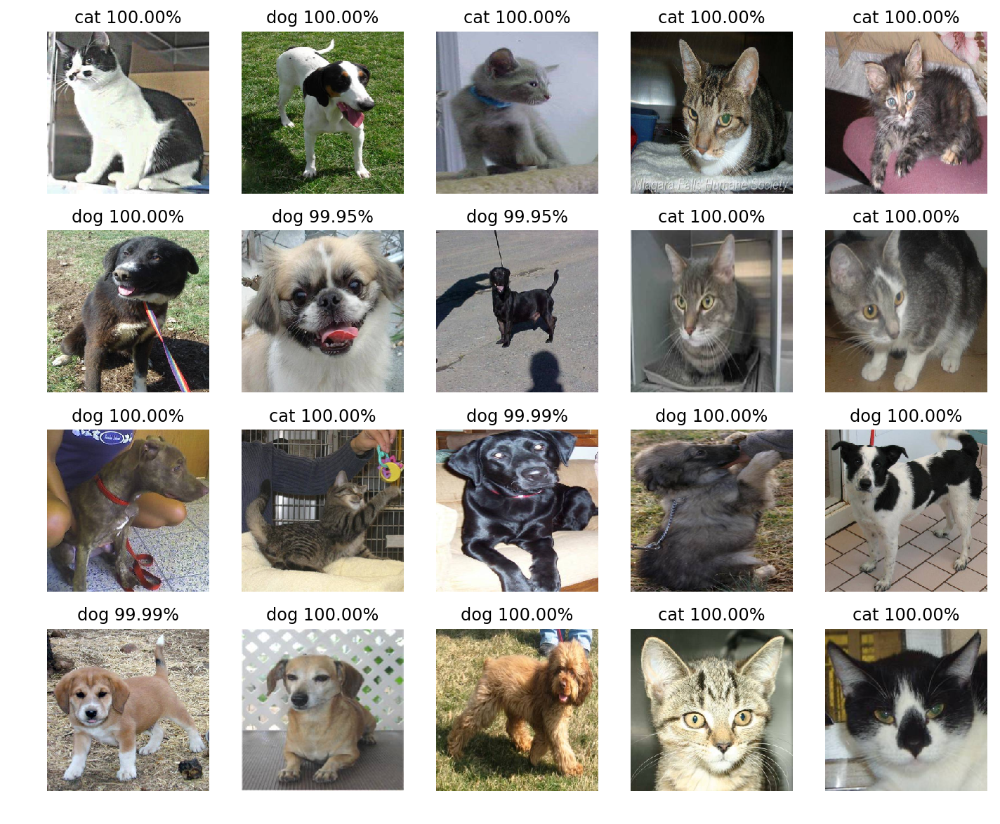

In [17]:
import matplotlib.pyplot as plt
import random
%matplotlib inline

plt.figure(figsize=(12, 10))
for i in range(20):
    n = random.randint(1, n_test)
    img = X_test[n - 1]
    plt.subplot(4, 5, i+1)
    if prediction[n - 1] < 0.5:
        plt.title('cat %.2f%%' % (100 - prediction[n - 1]*100))
    else:
        plt.title('dog %.2f%%' % (prediction[n - 1]*100))
    
    plt.axis('off')
    plt.imshow(img[:, :, ::-1])

### 8. feature heatmap

In [108]:
weights = model.layers[779].get_weights()[0]
model2 = Model(model.input, [model.layers[780].output, model.output])

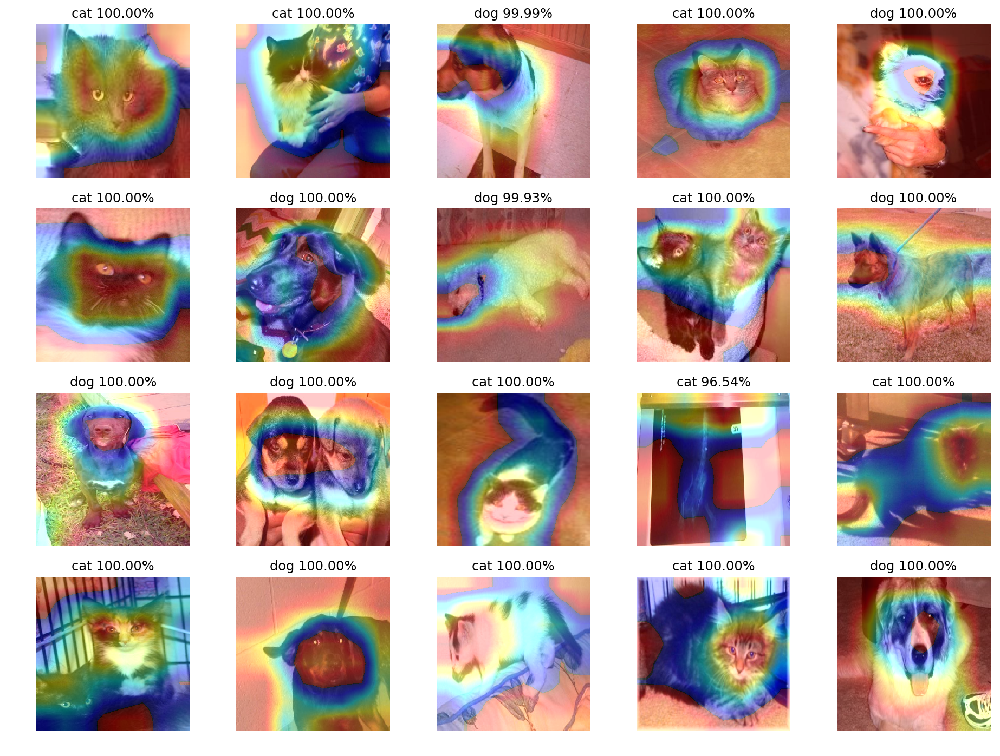

In [113]:
plt.figure(figsize=(16, 12))
for i in range(20):
    plt.subplot(4, 5, i+1)
    img = cv2.imread('data/test/%d.jpg' % random.randint(1, 12500))
    img = cv2.resize(img, IMG_SHAPE)
    x = img.copy()
    x.astype(np.float32)
    out, prediction = model2.predict(np.expand_dims(x, axis=0))

    out = out[0]
    prediction = prediction[0]

    if prediction < 0.5:
        plt.title('cat %.2f%%' % (100 - prediction*100))
    else:
        plt.title('dog %.2f%%' % (prediction*100))

    cam = (prediction - 0.5) * np.matmul(out, weights)
    cam -= cam.min()
    cam /= cam.max()
    cam -= 0.2
    cam /= 0.8

    cam = cv2.resize(cam, IMG_SHAPE)
    cam = np.uint8(255 * cam)
    heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)
    heatmap[np.where(cam <= 0.2)] = 0

    out = cv2.addWeighted(src1=img, alpha=0.8, src2=heatmap, beta=0.4, gamma=0)

    plt.axis('off')
    plt.imshow(out[:,:,::-1])

### 9 active CAM

In [37]:
target = X[28][:, :, ::-1]
out_base = base_model.predict(np.expand_dims(target, axis=0))[0]

In [10]:
def predict_on_weights(out_base, weights):
    gap = np.average(out_base, axis=(0, 1))
    logit = np.dot(gap, np.squeeze(weights))
    return 1 / (1 +  np.e ** (-logit))

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

def getCAM(image, feature_maps, weights, display=False):
    
    predict = predict_on_weights(feature_maps, weights)
    
    # Weighted Feature Map
    cam = (predict - 0.5) * np.matmul(feature_maps, weights)
    cam = (cam - cam.min()) / (cam.max() - cam.min())
    cam_resize = cv2.resize(cam, IMG_SHAPE)
    cam_resize = 255 * cam_resize
    cam_resize = cam_resize.astype(np.uint8)

    heatmap = cv2.applyColorMap(cam_resize, cv2.COLORMAP_JET)
    heatmap[np.where(cam_resize <= 100)] = 0
    
    out = cv2.addWeighted(src1=image, alpha=0.8, src2=heatmap, beta=0.4, gamma=0)
    out = cv2.resize(out, dsize=(400, 400))
    
    prediction = model.predict(np.expand_dims(image, axis=0))[0][0]
    if prediction < 0.5:
        text = 'cat %.2f%%' % (100 - prediction * 100)
    else:
        text = 'dog %.2f%%' % (prediction * 100)
        
    cv2.putText(out, text, (210, 40), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.9, 
                  color=(123,222,238), thickness=2, lineType=cv2.LINE_AA)
    if display:
        plt.figure(figsize=(8, 8))
        plt.imshow(out[:, :, :])
        plt.show()
    return out

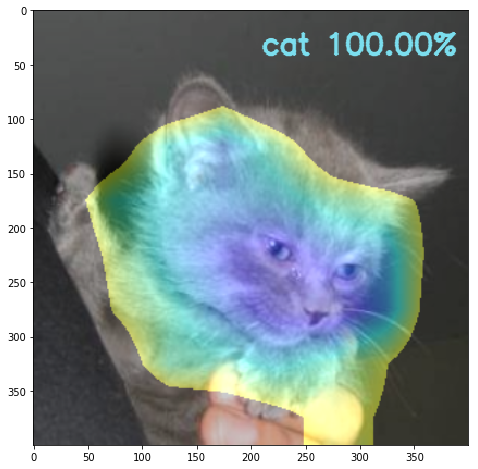

array([[[85, 86, 86],
        [85, 86, 86],
        [85, 86, 86],
        ...,
        [61, 62, 62],
        [60, 62, 62],
        [60, 62, 61]],

       [[85, 86, 86],
        [85, 86, 86],
        [85, 86, 86],
        ...,
        [61, 62, 62],
        [60, 62, 62],
        [60, 62, 61]],

       [[84, 86, 86],
        [84, 86, 86],
        [84, 86, 86],
        ...,
        [61, 62, 62],
        [61, 62, 61],
        [60, 62, 61]],

       ...,

       [[70, 71, 75],
        [70, 70, 74],
        [69, 70, 74],
        ...,
        [50, 50, 42],
        [50, 50, 42],
        [50, 50, 42]],

       [[70, 71, 75],
        [70, 70, 74],
        [69, 70, 74],
        ...,
        [50, 50, 42],
        [50, 50, 42],
        [50, 50, 42]],

       [[70, 70, 74],
        [70, 70, 74],
        [70, 70, 74],
        ...,
        [50, 50, 42],
        [50, 50, 42],
        [50, 50, 42]]], dtype=uint8)

In [38]:
getCAM(image=target, feature_maps=out_base, weights=weights[-1], display=True)

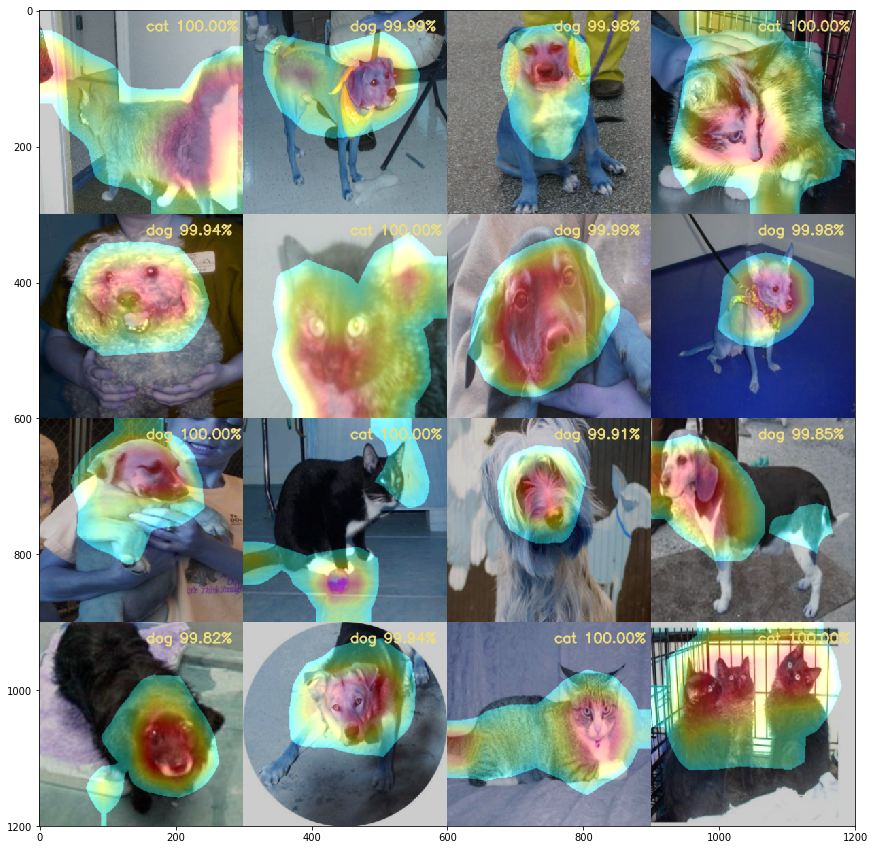

(1200, 1200, 3)

In [30]:
import random

def batch_CAM(weights):
    result = None
    for j in range(4):
        for i in range(4):
            n = random.randint(0, len(X))
            src = X[n][:, :, ::-1]
            out_base = base_model.predict(np.expand_dims(src, axis=0))[0]
            out = getCAM(image=src, feature_maps=out_base, weights=weights)
            out = cv2.resize(out, dsize=(300, 300))
            if i > 0:
                canvas = np.concatenate((canvas, out), axis=1)
            else:
                canvas = out
        if j > 0:
            result = np.concatenate((result, canvas), axis=0)
        else:
            result = canvas
    return result

plt.figure(figsize=(15, 15))
plt.imshow(batch_CAM(weights[-1])[:, :, ::-1])
plt.show()
batch_CAM(weights[0]).shape

In [31]:
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter('output_batch.mp4',fourcc, 20.0, (1200, 1200))

for weight in tqdm(weights):
    img = batch_CAM(weight)
    out.write(img)
#     cv2.imshow('frame', img)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

out.release()
cv2.destroyAllWindows()

100%|██████████| 78/78 [03:38<00:00,  2.80s/it]


In [39]:
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter('output4.mp4',fourcc, 20.0, (400, 400))

for weight in tqdm(weights):
    img = getCAM(image=target, feature_maps=out_base, weights=weight)
    out.write(img)
#     cv2.imshow('frame', img)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

out.release()
cv2.destroyAllWindows()

100%|██████████| 78/78 [00:07<00:00, 10.01it/s]
